# <center><font color='DeepPink'> Challenge Data Science 2022 </font><center>
## <center><font color='DeepPink'> genomawork </font><center>
### <center><b> Bárbara Pérez </b><center>
#### <center><b>Agosto, 2022</b><center>


________

## <font color='DeepPink'>Sección 1 - Preliminares </font>

### 1.1 Descripción del problema

Imagina que nuestro cliente Stark Industries se ha planteado el objetivo de mejorar sus contrataciones.
Dentro de sus principales problemas, Stark Industries identifica la rotación de personal, es decir, los
colaboradores que abandonan la compañía. Stark Industries ha recolectado algunos datos para poder
comprender mejor el fenómeno de la rotación de personal y se te ha encargado a ti extraer valor de estos
datos. Como mínimo, se plantean las siguientes preguntas:
1. ¿Qué variables presentan alguna relación con la rotación? ¿Qué tipo de relación presentan? ¿Es
significativa?
2. ¿Podemos crear un modelo que permita identificar a un empleado con alto riesgo de rotación?
¿Cuáles son los pros y los contras de un modelo de este tipo?
3. ¿Cómo podemos medir el desempeño de un modelo de estas características?
4. ¿Qué otros tipos de datos pueden ser valiosos para alimentar a estos modelos?5. ¿Podríamos generar un modelo que identifique a las personas con alto riesgo de rotación antes de
contratarlas? ¿En qué se diferenciaría este modelo del anterior?
6. ¿Qué recomendarías a Stark Industries para atacar este problema?

### 1.2 Descripción de la base de datos

- **stag** = Experiencia (Puntaje).


- **event** = Rotación de personal.


- **gender** = Genero (f/m).


- **age** = Edad del empleado.


- **industry** = Rubro (Sector de actividad del empleado).


- **profession** = Profesion del empleado.


- **traffic** = Como llego el empleado a la empresa.
    - **youjs**: Ha solicitado una vacante en el sitio web de empleo.
    - **empjs**: El empleador llegó a usted a través de su currículum en el sitio de empleo.
    - **rabrecNErab**: El empleador se puso en contacto con usted por recomendación de una persona que le conoce.
    - **friends**: Invitado por el empleador, lo conocíamos antes del empleo.
    - **referal**:  Ha contactado directamente con la empresa por recomendación de un amigo, que es empleado de la misma.
    - **KA**: La agencia de contratación le ha puesto en contacto con el empleador.
    - **recNErab**: Se puso en contacto con la empresa directamente por recomendación de su amigo - NO empleado de esta empresa.
    - **advert**: Se puso en contacto con la empresa directamente (tras enterarse por la publicidad, conocer la marca de la empresa, etc.)



- **coach**: Presencia de un tutor (formación) en periodo de prueba.


- **head_gender**: supervisor (jefe (supervisor) género).


- **greywage**: El salario no le parece a las autoridades fiscales. El salario gris en Rusia o Ucrania significa que el empleador (la empresa) paga sólo una pequeña cantidad de salario por encima del salario blanco (el salario blanco significa el salario mínimo).


- **way**: Medio de transporte del empleado.


- **Extraversion**: Extrovertido (puntaje).


- **independ (agreeableness)**: Simpatía (puntaje).


- **selfcontrol (conscientiousness)**: Conciente, control de sí mismo (puntaje).


- **anxiety (neuroticism)**: neuroticismo, ansiedad. (Puntaje).


- **novator (openness)**: abierto de mente, innovador (Puntaje).

_______

## <font color='DeepPink'>Sección 2 - Aspectos computacionales </font>

### 2.1 Librerías y módulos

Para la correcta realización del trabajo se hace necesesaro importar librerias no nativas de python, que permitan realziar el análisis de los datos, la transformación de estos, construir los modelos predictivos, entrenarlos y validarlos. 

A continuación se detallan e importan las librerías:

In [1]:
#Importar librerias
import matplotlib.pyplot as plt #version 3.5.2
import pandas as pd  #version 1.4.3
import seaborn as sns  #version 0.11.2
import numpy as np  #version 1.23.0
import scipy.stats as stats  #version 1.81
from scipy.stats import norm  

#Importar statsmodels
#Regresion econometrica
import statsmodels.formula.api as smf  


#Regresión con Machine Learning
from sklearn.linear_model import LinearRegression as linreg  
from sklearn.linear_model import LogisticRegression  
from sklearn.model_selection import train_test_split  
from sklearn.model_selection import GridSearchCV  
from sklearn.preprocessing import StandardScaler  
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score

#Metricas de reporte 
from sklearn.metrics import classification_report  
from sklearn.metrics import accuracy_score  
from sklearn.metrics import roc_curve  
from sklearn.metrics import roc_auc_score, auc  
from sklearn import metrics

#Librerias para visualizacion de graficos
import matplotlib.pyplot as plt


#Libreria que permite ignorar avisos warnirng
import warnings
warnings.filterwarnings("ignore")

#librería para análisis exploratorio
import pandas_profiling
import plotly.express as px


___________

## <font color='DeepPink'>Sección 3 - Descripción </font>

### 3.1 Análisis descriptivo de las variables

In [2]:
#Importar base de datos
df = pd.read_csv('turnover.csv',engine='python',encoding='latin1')

In [3]:
#Revisamos los datos importados
df.head()

,stag,event,gender,age,industry,profession,traffic,coach,head_gender,greywage,way,extraversion,independ,selfcontrol,anxiety,novator
0,7.030801,1,m,35.0,Banks,HR,rabrecNErab,no,f,white,bus,6.2,4.1,5.7,7.1,8.3
1,22.965092,1,m,33.0,Banks,HR,empjs,no,m,white,bus,6.2,4.1,5.7,7.1,8.3
2,15.934292,1,f,35.0,PowerGeneration,HR,rabrecNErab,no,m,white,bus,6.2,6.2,2.6,4.8,8.3
3,15.934292,1,f,35.0,PowerGeneration,HR,rabrecNErab,no,m,white,bus,5.4,7.6,4.9,2.5,6.7
4,8.410678,1,m,32.0,Retail,Commercial,youjs,yes,f,white,bus,3.0,4.1,8.0,7.1,3.7


In [4]:
#Revisamos los tipos de datos que tiene cada columna
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1129 entries, 0 to 1128
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   stag          1129 non-null   float64
 1   event         1129 non-null   int64  
 2   gender        1129 non-null   object 
 3   age           1129 non-null   float64
 4   industry      1129 non-null   object 
 5   profession    1129 non-null   object 
 6   traffic       1129 non-null   object 
 7   coach         1129 non-null   object 
 8   head_gender   1129 non-null   object 
 9   greywage      1129 non-null   object 
 10  way           1129 non-null   object 
 11  extraversion  1129 non-null   float64
 12  independ      1129 non-null   float64
 13  selfcontrol   1129 non-null   float64
 14  anxiety       1129 non-null   float64
 15  novator       1129 non-null   float64
dtypes: float64(7), int64(1), object(8)
memory usage: 141.2+ KB


In [5]:
#Se cuentan los NaN en dataframe
df.isna().sum()

stag            0
event           0
gender          0
age             0
industry        0
profession      0
traffic         0
coach           0
head_gender     0
greywage        0
way             0
extraversion    0
independ        0
selfcontrol     0
anxiety         0
novator         0
dtype: int64

No se observan datos perdidos en el DataFrame

In [6]:
#Se observa la descripcion estadaistica
df.describe()

,stag,event,age,extraversion,independ,selfcontrol,anxiety,novator
count,1129.000000,1129.000000,1129.000000,1129.000000,1129.000000,1129.000000,1129.000000,1129.000000
mean,36.627526,0.505757,31.066965,5.592383,5.478034,5.597254,5.665633,5.879628
std,34.096597,0.500188,6.996147,1.851637,1.703312,1.980101,1.709176,1.904016
min,0.394251,0.000000,18.000000,1.000000,1.000000,1.000000,1.700000,1.000000
25%,11.728953,0.000000,26.000000,4.600000,4.100000,4.100000,4.800000,4.400000
50%,24.344969,1.000000,30.000000,5.400000,5.500000,5.700000,5.600000,6.000000
75%,51.318275,1.000000,36.000000,7.000000,6.900000,7.200000,7.100000,7.500000
max,179.449692,1.000000,58.000000,10.000000,10.000000,10.000000,10.000000,10.000000


In [7]:
# from sklearn.preprocessing import LabelEncoder
# print('Categorical columns: ')
# for col in df.columns:
#     if df[col].dtype == 'object':
#         values = df[col].value_counts()
#         values = dict(values)
        
#         print(str(col))
#         label = LabelEncoder()
#         label = label.fit(df[col])
#         df[col] = label.transform(df[col].astype(str))
        
#         new_values = df[col].value_counts()
#         new_values = dict(new_values)
        
#         value_dict = {}
#         i=0
#         for key in values:
#             value_dict[key] = list(new_values)[i]
#             i+= 1
#         print(value_dict)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1129 entries, 0 to 1128
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   stag          1129 non-null   float64
 1   event         1129 non-null   int64  
 2   gender        1129 non-null   object 
 3   age           1129 non-null   float64
 4   industry      1129 non-null   object 
 5   profession    1129 non-null   object 
 6   traffic       1129 non-null   object 
 7   coach         1129 non-null   object 
 8   head_gender   1129 non-null   object 
 9   greywage      1129 non-null   object 
 10  way           1129 non-null   object 
 11  extraversion  1129 non-null   float64
 12  independ      1129 non-null   float64
 13  selfcontrol   1129 non-null   float64
 14  anxiety       1129 non-null   float64
 15  novator       1129 non-null   float64
dtypes: float64(7), int64(1), object(8)
memory usage: 141.2+ KB


In [9]:
#Definimos la variables categóricas
variables_categoricas = []
for n, i in enumerate(df):
    if df[i].dtypes =="object":
        variables_categoricas.append(i)
variables_categoricas 

['gender',
 'industry',
 'profession',
 'traffic',
 'coach',
 'head_gender',
 'greywage',
 'way']

In [10]:
#inspeccionamos la variables categóricas para identificar el grupo minoritario
for i in variables_categoricas:
    print("\n\n",i)
    print((df[i].value_counts()),"\n")
    print((df[i].value_counts()/len(df[i])))



 gender
f    853
m    276
Name: gender, dtype: int64 

f    0.755536
m    0.244464
Name: gender, dtype: float64


 industry
Retail             289
manufacture        145
IT                 122
Banks              114
etc                 94
Consult             74
State               55
Building            41
PowerGeneration     38
transport           38
Telecom             36
Mining              24
Pharma              20
Agriculture         15
RealEstate          13
 HoReCa             11
Name: industry, dtype: int64 

Retail             0.255979
manufacture        0.128432
IT                 0.108060
Banks              0.100974
etc                0.083260
Consult            0.065545
State              0.048716
Building           0.036315
PowerGeneration    0.033658
transport          0.033658
Telecom            0.031887
Mining             0.021258
Pharma             0.017715
Agriculture        0.013286
RealEstate         0.011515
 HoReCa            0.009743
Name: industry, dtype: floa

In [11]:
#Se observa que HoReCa de la variable 'industry' tiene un espacio, por lo que nos aseguramos , revisaremos y eliminaremos dicho espacio.

#revisamos la variable 'industry'
df['industry'].value_counts()

Retail             289
manufacture        145
IT                 122
Banks              114
etc                 94
Consult             74
State               55
Building            41
PowerGeneration     38
transport           38
Telecom             36
Mining              24
Pharma              20
Agriculture         15
RealEstate          13
 HoReCa             11
Name: industry, dtype: int64

In [12]:
#limpiamos la variable 'industry' de los espacios en blanco
df['industry'] = df['industry'].str.strip()

In [13]:
#revisamos la variable 'industry' luego de los cambios realizados
df['industry'].value_counts()

Retail             289
manufacture        145
IT                 122
Banks              114
etc                 94
Consult             74
State               55
Building            41
PowerGeneration     38
transport           38
Telecom             36
Mining              24
Pharma              20
Agriculture         15
RealEstate          13
HoReCa              11
Name: industry, dtype: int64

In [14]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Se observa una alta correlacion entre las siguientes variables:

- extraversion alta correlación con selfcontrol
- novator alta correlación con selfcontrol y extraversion
- gender alta correlación con profession e industry

In [15]:
#Fucnion para graficar histogramas para visualizar la data
def histograma(dataframe):
    '''
    Función de histograma entregando Dataframe.
    
        Parameters: Dataframe.
        
        Returns: Histograma con información del dataframe y sus columnas.              
                       
    '''
    for col in dataframe.columns:
        plt.figure(figsize=(15,5))
        sns.histplot(dataframe[col])
        plt.title(f'Histograma de {col}')
        plt.xticks(rotation=55)
        plt.show()

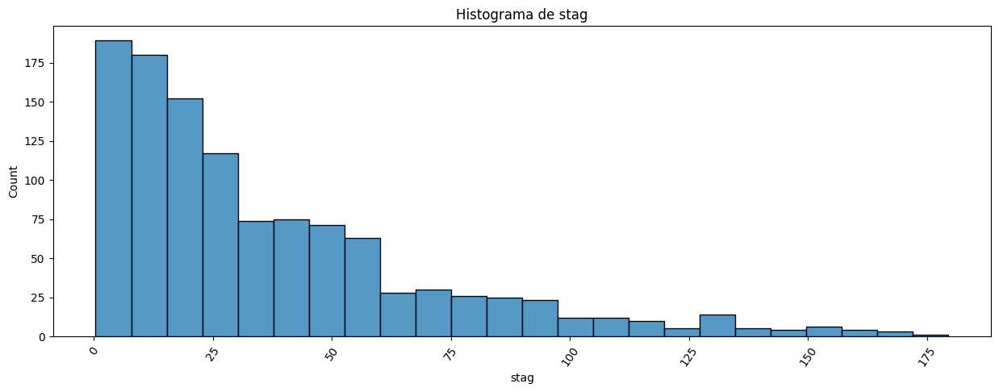

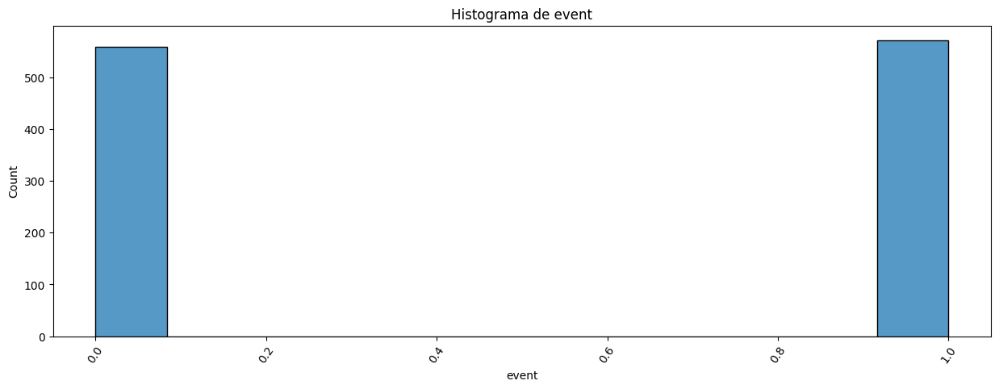

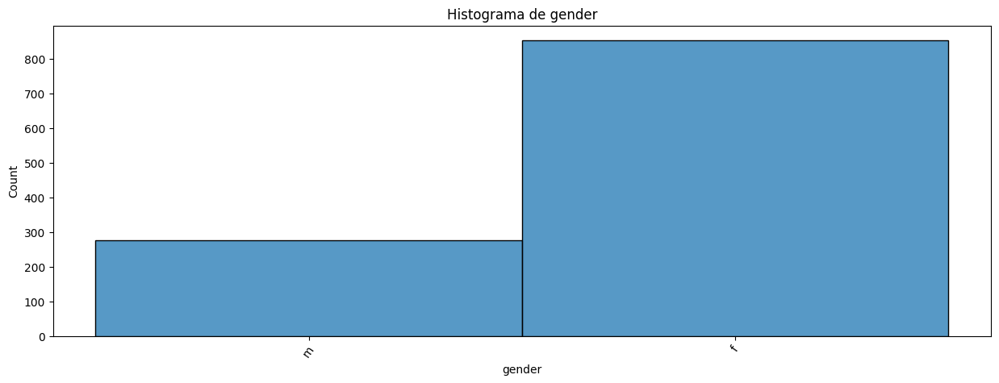

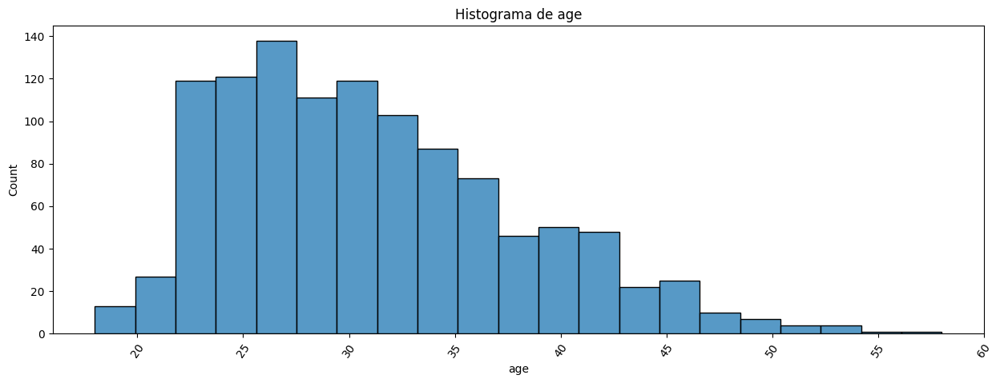

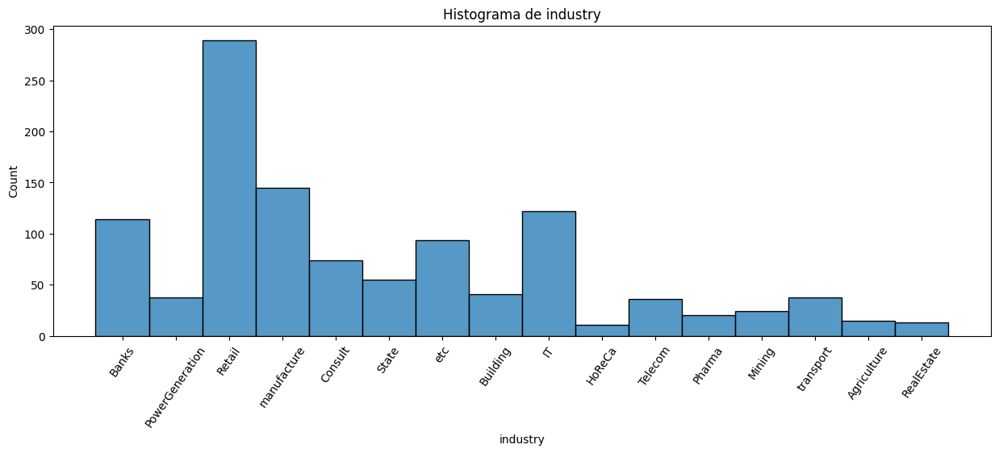

...

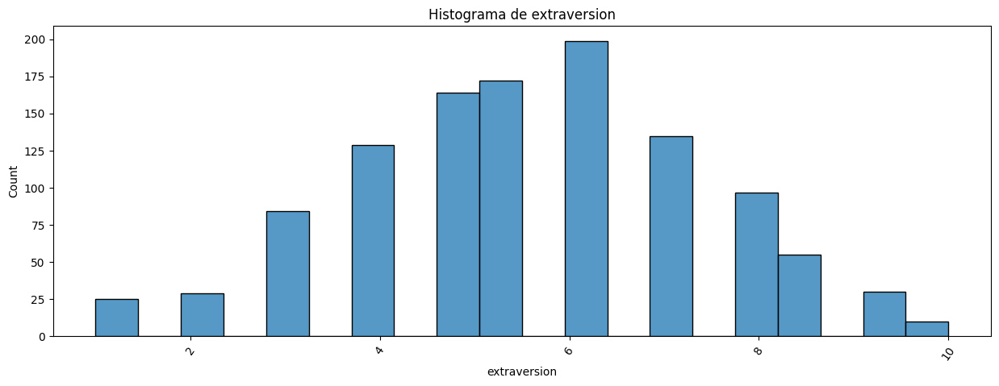

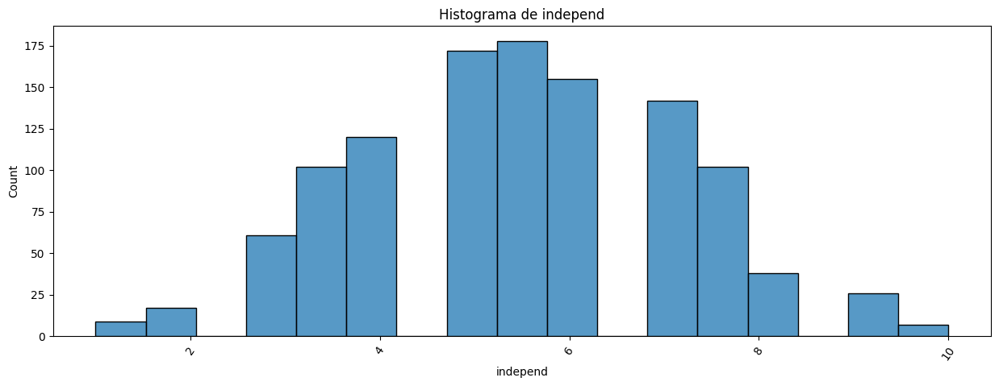

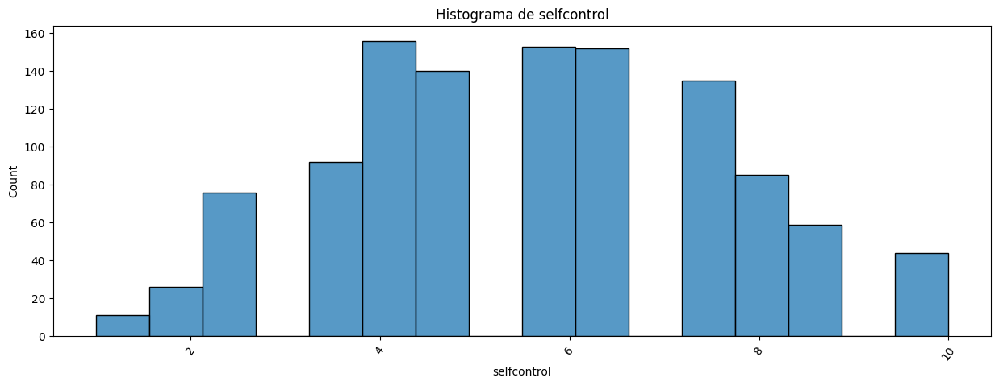

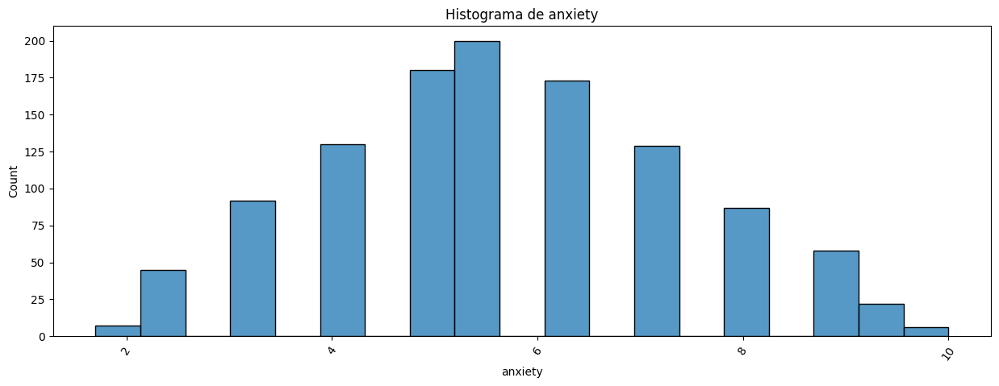

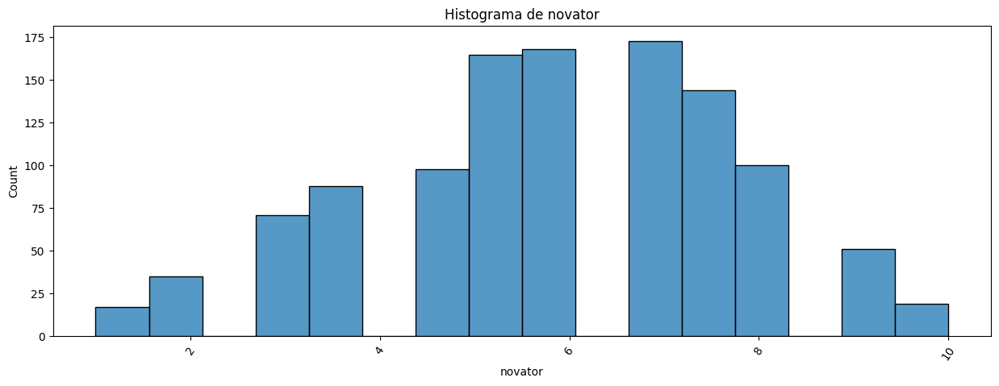

In [16]:
histograma(df)

- Se observa que las personas encuestadas la mayoría poseen poca experiencia de trabajo

- La mayoría de las personas encuestadas son mujeres

- Los trabajoderes encuestados en su mayoría poseen entre 23 a 35 años aproximadamente

- Del total de personas encuestadas, una gran parte pertenecen a trabajadores del Retail

- La gran mayoría de las personas encuestadas son profesionales de Recursos Humanos

- La mayoría de las personas encuestadas llegaron a la empresa: 
	- Ha solicitado una vacante en el sitio web de empleo (youjs)
	- El empleador llegó a la persona a través de su curriculum en un sitio de empleo
	- El empleador se puso en contacgto con usted por recomendación de una persona que le conoce (rabrecNErab)

- La mayoría de las personas encuestadas No tuvieron presencia de un tutor mientras duraba su periodo de prueba

- El genero del supervisor tienen valores similares entre hombre y mujeres.

- La mayoría de las personas encuestadas ganan el sueldo mínimo

- Un gran porcentaje de los entrevistados viajan en bus para llegar al trabajo, seguido por los que llegan auto y en menor porcentaje las personas que llegan caminando a su trabajo.

- La mayoría de las personas encuestadas tienden a tener un puntaje medio en extroversión. De igual manera ocurre con la variable independ, selfcontrol y anxiety.
- Mientras que las personas ‘novator’ tienden a tener un puntaje entre 5 a 8 en su mayoría.


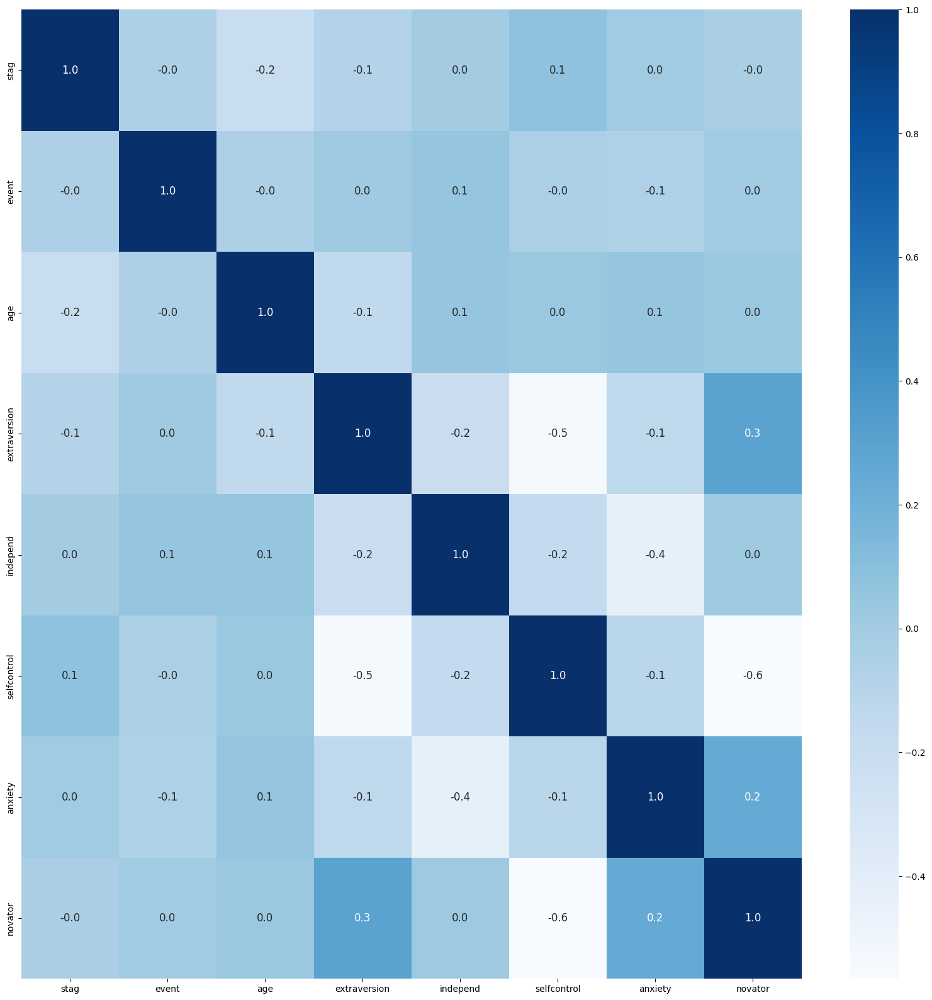

In [17]:
# Mapa de correlación (heatmap)
plt.subplots(figsize=(20, 20))
sns.heatmap(df.corr(), cmap='Blues', annot=True, annot_kws={"size": 12}, fmt=".1f");
plt.show()

Existe una correlación  de un 30% entre:
- las personas extrovertedicas con las personas abiertas de mente

Mientras que hay una correlación de un 20% entre:
- Las personas con tendencias mas ansiosas con las personas abiertas de mente.

Es por ello que procederé a realizar un desgloce de los datos para una mejor lectura de los datos

In [18]:
#Observamos la data de rotacion de personal
df_event= df['event'].value_counts()
df_event

1    571
0    558
Name: event, dtype: int64

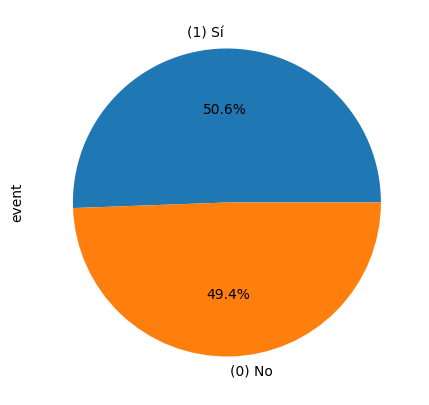

In [19]:
event_label = ['(1) Sí', '(0) No']
df_event.plot.pie(y = 'event', figsize=(5, 5), autopct='%1.1f%%', labels=event_label)
plt.show();

Por lo que se muestra en el grafico, en la data entregada sólo un 50.6% del personal que contestó la encuesta ha renunciado, mientras que el 49,4% al parecer no ha presentado su renuncia o continua trabajando.

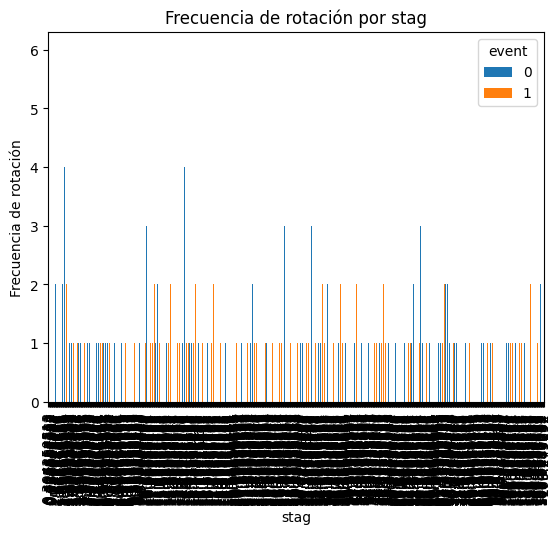

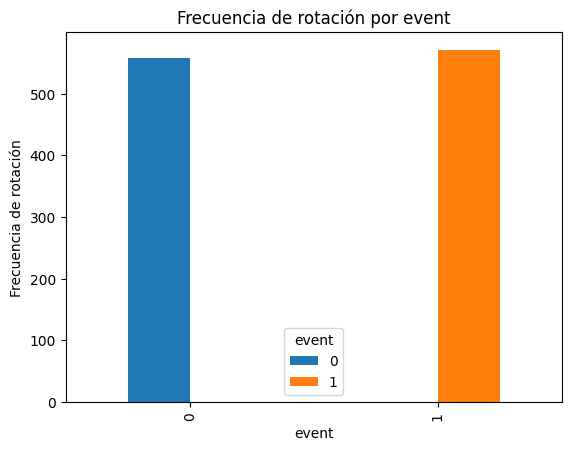

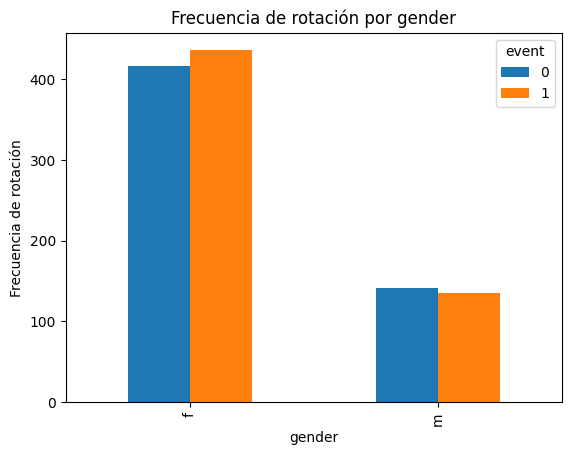

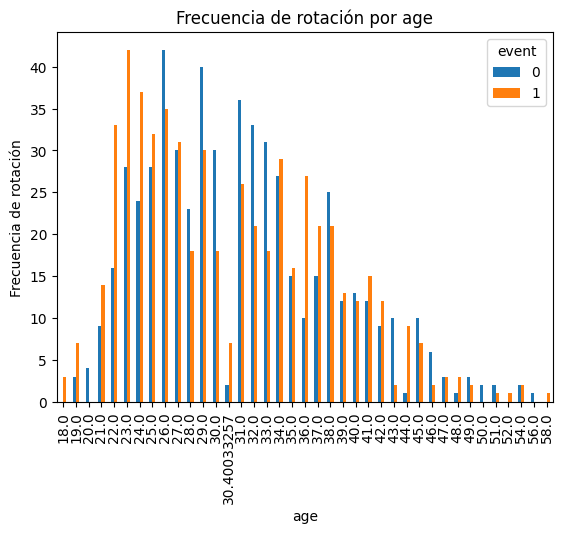

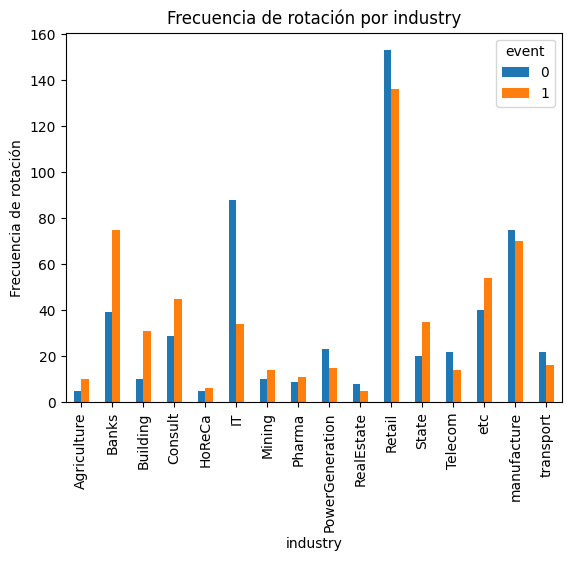

...

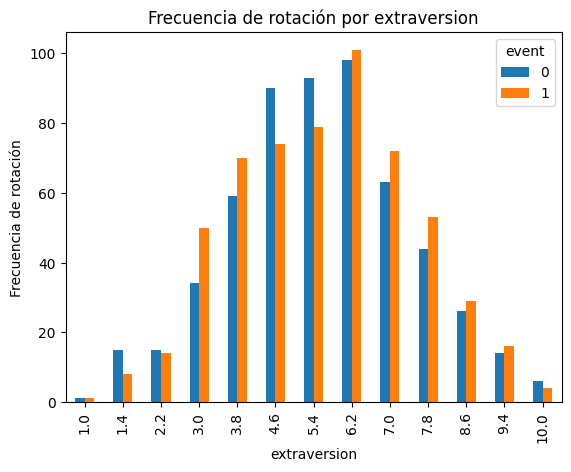

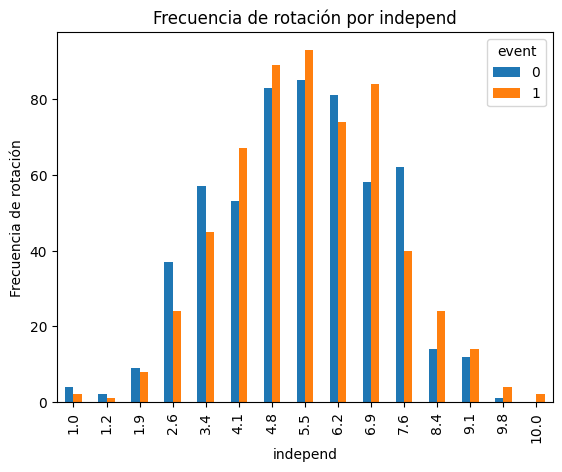

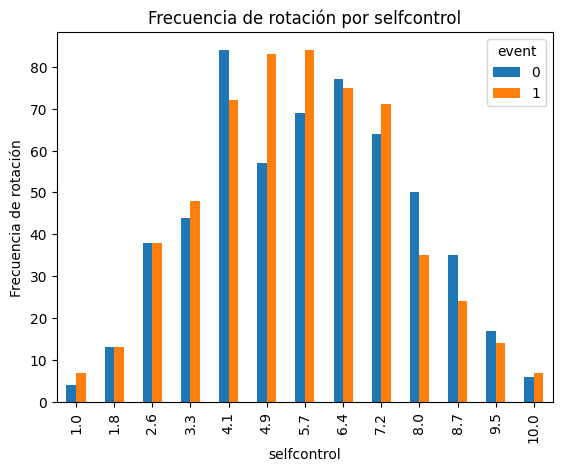

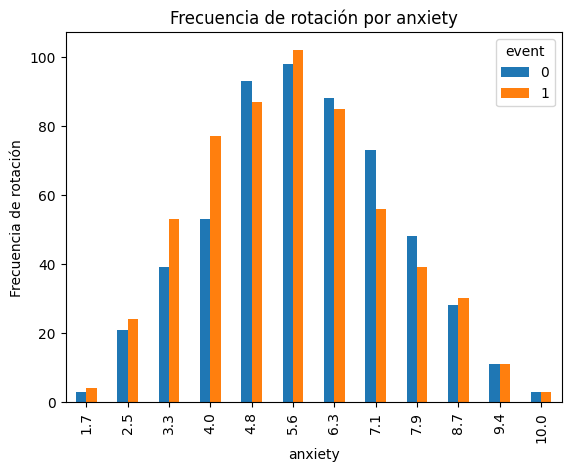

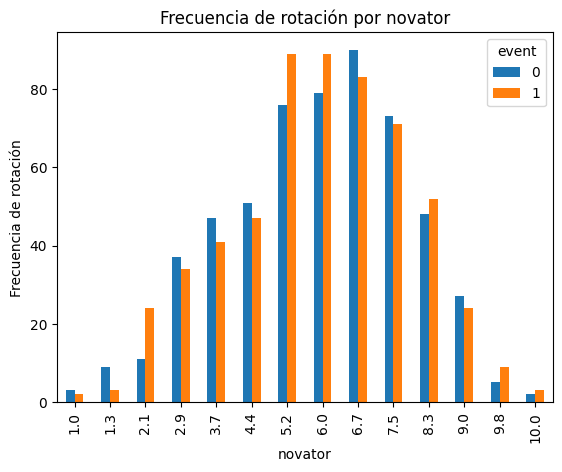

In [20]:
# Identificamos las variables 

df_graficos = df.select_dtypes(include=['object', 'float64', 'int64']).copy() # La guardamos como variable para su posterior uso.

for col in df_graficos.columns.values:
    pd.crosstab(df[col],df.event).plot(kind='bar')
    plt.title('Frecuencia de rotación por {}'.format(col))
    plt.ylabel('Frecuencia de rotación')
    plt.xlabel('{}'.format(col))
    plt.show()


Según los graficos mostrados podemos señalar lo siguiente:

- Se observa que el grafico donde se compara la experiencia laboral con la rotación de personal es ilegible, por lo que se decide realizar el histograma por si solo.


- El grafico de rotación por el genero del trabajador indica que no es una variable significativa para predecir una tendencia clara sobre las personas que tienden a tener más renuncia.


- **La mayor tendencia en edad a presentar más rotación es el trabajador de edad promedio de entre los 22 a 24 años**, teniendo su mayor peack con las personas de 23 años, sin embargo, la mayor diferencia se observa en los entrevistados de 22 años, teniendo un 50% aproximado más en renuncias sobre los de la misma edad que no han presentado rotación laboral.


- **Se observa que la profesión de docencia presenta casi un 100% de renuncia, por lo que revisaremos esa variable por si sola. También del total de los trabajadores de banco los que presentan el doble de numero de renuncia versus los que no la han presentado, seguido por los Consultores**. Si bien en la industria del Retail se muestran con una alta frecuencia de rotación de personal, esta es levemente menor a la presencia de trabajadores que no han presentado renuncia o rotación laboral.


- En la frecuencia de rotación por profesión no se observa información significativa


- Se observa una mayor frecuencia en las personas que el empleador se puso en contacto con el trabajador por recomendación de una persona que le conoce(rabrecNErab), seguido por la diferencia entre las personas que se contactaron directamente con la empresa por recomendación de un amigo, que es empleado de la misma (referal).


- La rotación por la presencia de un tutor en el periodo de prueba no se observa significativa.


- Si el supervisor es hombre tiende a una leve probabilidad de presentar su renuncia versus con las mujeres.


- No se observa una diferencia relevante entre la rotación de personal y el tipo de salario.


- **Las personas que viajan en bus y en auto tienden levemente más a presentar la renuncia**, versus las personas que caminan al trabajo.


- Las personas que tienen un puntaje entre 3.0 a 3.8 y 6 a 9.4 de extroversión tienen levemente a presentar un mayor numero de renuncia vs el promedio.


- **Las personas que tienen un puntaje cercano a 6.9 de independencia o simpatía tienden a presentar más renuncias en comparación a los otros puntajes de este.**


- Las personas que tienen un puntaje promedio entre 4.9 a 5.7 en que tan consciente es de sí mismo tienden a presentar mayor número de renuncias vs los otros puntajes.


- **Las personas con ansiedad moderada a baja tienden a presentar levemente más renuncia versus los otros puntajes, teniendo un puntaje promedio entre 1.7 a 4.0**.


- Las personas con puntaje promedio en la variable abierto de mente tienen levemente a presentar mayor renuncia vs los otros puntajes, teniendo un promedio entre 5.2 a 6.0.

In [21]:
fig = px.histogram(df, x="stag", color='event', marginal='box', barmode='group')
fig.show()

Se observa un aumento entre las personas que poseen menos experencia de trabajo con mayor presentación de renuncia o rotación laboral

In [22]:
fig2 = px.histogram(df, x=df['profession'], color='event', marginal='box', barmode='group')
fig2.show()

Se observa que la profesion de "Teaching" o profesor del total de reclutados el total ha presentado su renuncia, esto nos podría traer problemas a futuro en los modelos predictivos, por lo que aplicaremos logaritmo para poder tener una mejor lectura estos.

Para realizar una posterior modelación descriptiva y modelación predictiva binarizamos los datos de nuestro DataFrame


In [23]:
#Copiamos la data:
df_copy = df.copy()
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1129 entries, 0 to 1128
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   stag          1129 non-null   float64
 1   event         1129 non-null   int64  
 2   gender        1129 non-null   object 
 3   age           1129 non-null   float64
 4   industry      1129 non-null   object 
 5   profession    1129 non-null   object 
 6   traffic       1129 non-null   object 
 7   coach         1129 non-null   object 
 8   head_gender   1129 non-null   object 
 9   greywage      1129 non-null   object 
 10  way           1129 non-null   object 
 11  extraversion  1129 non-null   float64
 12  independ      1129 non-null   float64
 13  selfcontrol   1129 non-null   float64
 14  anxiety       1129 non-null   float64
 15  novator       1129 non-null   float64
dtypes: float64(7), int64(1), object(8)
memory usage: 141.2+ KB


In [24]:
# #Convertir la columna de tipo objeto a numerico
df_copy['stag'] = df_copy['stag'].astype(int)
df_copy['age'] = df_copy['age'].astype(int)
df_copy['extraversion'] = df_copy['extraversion'].astype(int)
df_copy['independ'] = df_copy['independ'].astype(int)
df_copy['selfcontrol'] = df_copy['selfcontrol'].astype(int)
df_copy['anxiety'] = df_copy['anxiety'].astype(int)
df_copy['novator'] = df_copy['novator'].astype(int)

In [25]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1129 entries, 0 to 1128
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   stag          1129 non-null   int32 
 1   event         1129 non-null   int64 
 2   gender        1129 non-null   object
 3   age           1129 non-null   int32 
 4   industry      1129 non-null   object
 5   profession    1129 non-null   object
 6   traffic       1129 non-null   object
 7   coach         1129 non-null   object
 8   head_gender   1129 non-null   object
 9   greywage      1129 non-null   object
 10  way           1129 non-null   object
 11  extraversion  1129 non-null   int32 
 12  independ      1129 non-null   int32 
 13  selfcontrol   1129 non-null   int32 
 14  anxiety       1129 non-null   int32 
 15  novator       1129 non-null   int32 
dtypes: int32(7), int64(1), object(8)
memory usage: 110.4+ KB


In [26]:
df_copy['profession'].value_counts()

HR                     757
IT                      74
Sales                   66
etc                     37
Marketing               31
BusinessDevelopment     27
Consult                 25
Commercial              23
manage                  22
Finanñe                 17
Engineer                15
Teaching                12
Accounting              10
Law                      7
PR                       6
Name: profession, dtype: int64

Al ser un gran numero de variables categoricas decidimos realizar un **get_dummies**, el cual se utiliza para la manipulación de datos. Convierte datos categóricos en variables ficticias o indicadoras.

In [27]:
#Binarizamos los datos:
df_binarizado = pd.get_dummies(df_copy, drop_first=True)
df_binarizado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1129 entries, 0 to 1128
Data columns (total 51 columns):
 #   Column                          Non-Null Count  Dtype
---  ------                          --------------  -----
 0   stag                            1129 non-null   int32
 1   event                           1129 non-null   int64
 2   age                             1129 non-null   int32
 3   extraversion                    1129 non-null   int32
 4   independ                        1129 non-null   int32
 5   selfcontrol                     1129 non-null   int32
 6   anxiety                         1129 non-null   int32
 7   novator                         1129 non-null   int32
 8   gender_m                        1129 non-null   uint8
 9   industry_Banks                  1129 non-null   uint8
 10  industry_Building               1129 non-null   uint8
 11  industry_Consult                1129 non-null   uint8
 12  industry_HoReCa                 1129 non-null   uint8
 13  ind

In [28]:
#Revisamos una lista con los nombres de nuestro dataframe
df_binarizado.columns

Index(['stag', 'event', 'age', 'extraversion', 'independ', 'selfcontrol',
       'anxiety', 'novator', 'gender_m', 'industry_Banks', 'industry_Building',
       'industry_Consult', 'industry_HoReCa', 'industry_IT', 'industry_Mining',
       'industry_Pharma', 'industry_PowerGeneration', 'industry_RealEstate',
       'industry_Retail', 'industry_State', 'industry_Telecom', 'industry_etc',
       'industry_manufacture', 'industry_transport',
       'profession_BusinessDevelopment', 'profession_Commercial',
       'profession_Consult', 'profession_Engineer', 'profession_Finanñe',
       'profession_HR', 'profession_IT', 'profession_Law',
       'profession_Marketing', 'profession_PR', 'profession_Sales',
       'profession_Teaching', 'profession_etc', 'profession_manage',
       'traffic_advert', 'traffic_empjs', 'traffic_friends',
       'traffic_rabrecNErab', 'traffic_recNErab', 'traffic_referal',
       'traffic_youjs', 'coach_no', 'coach_yes', 'head_gender_m',
       'greywage_white',

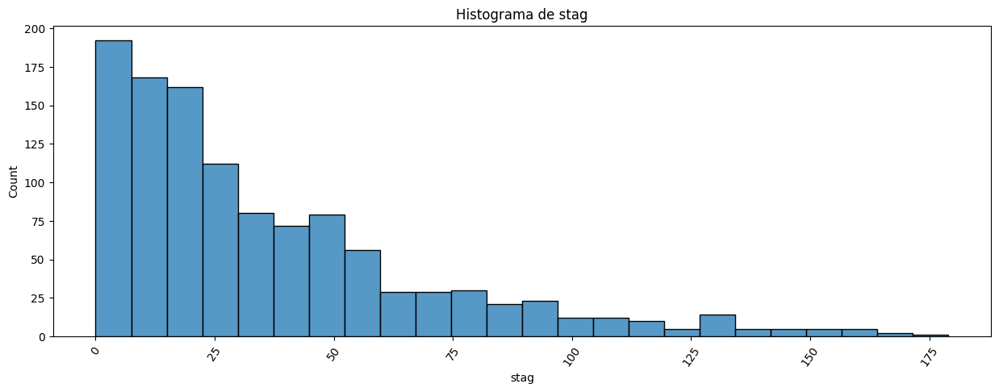

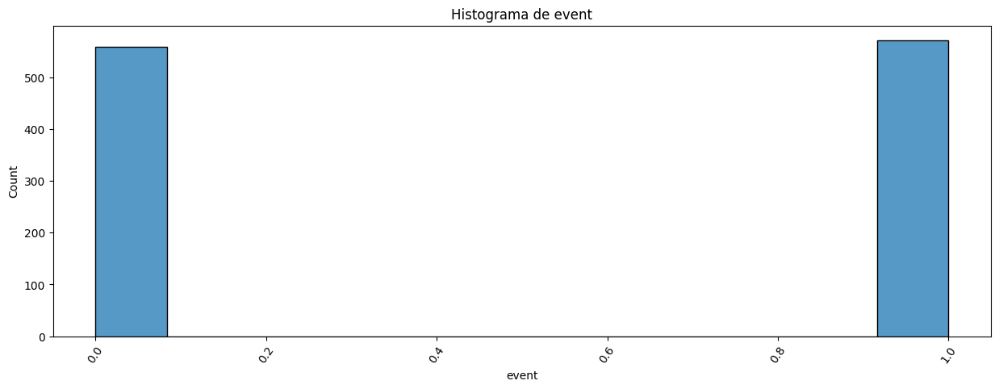

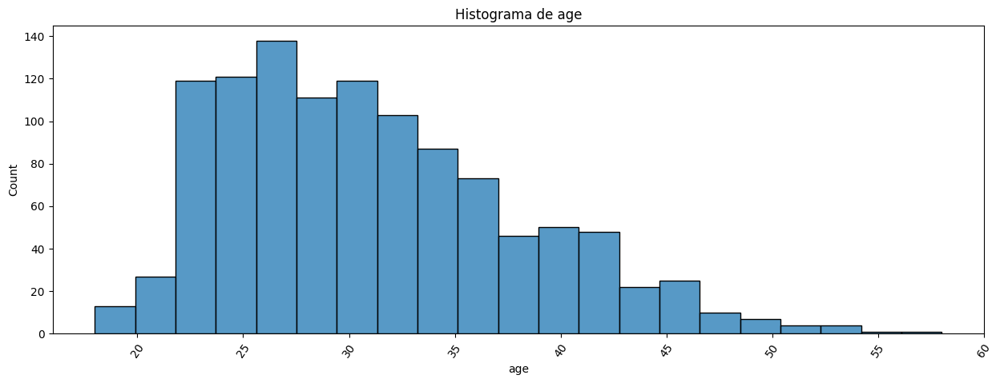

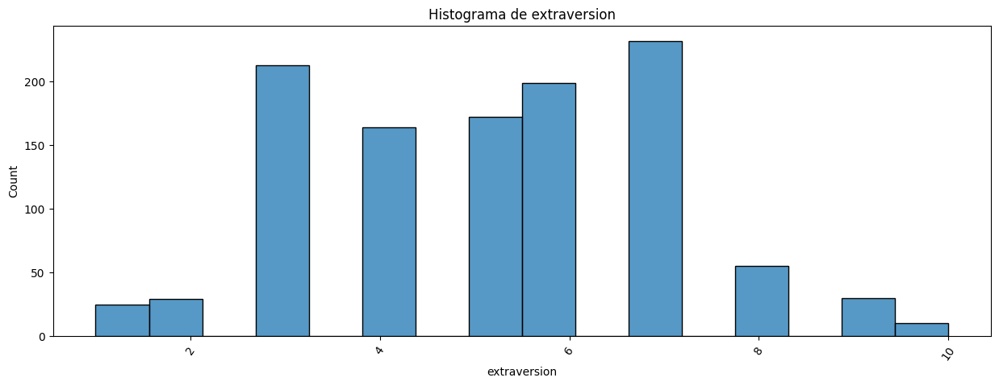

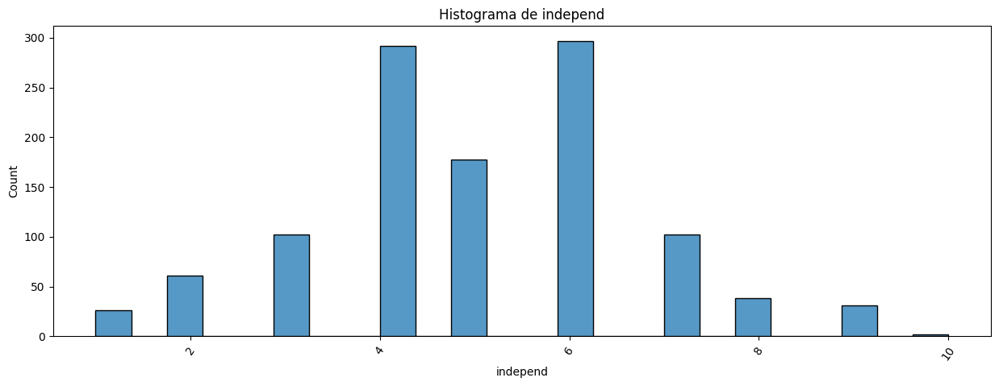

...

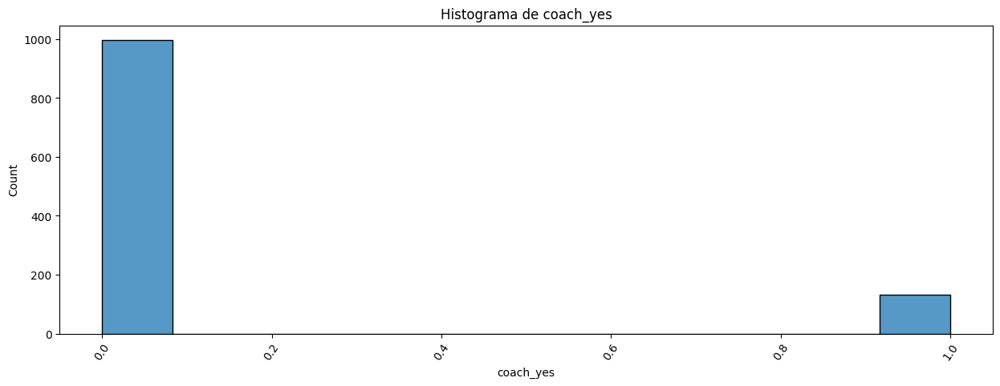

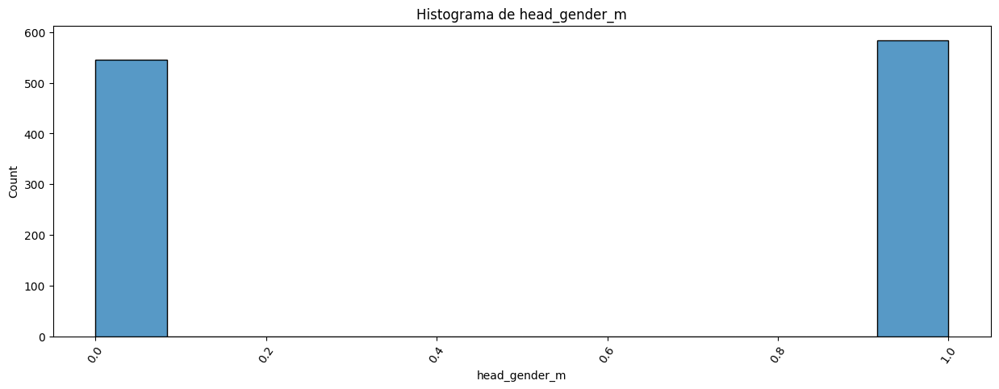

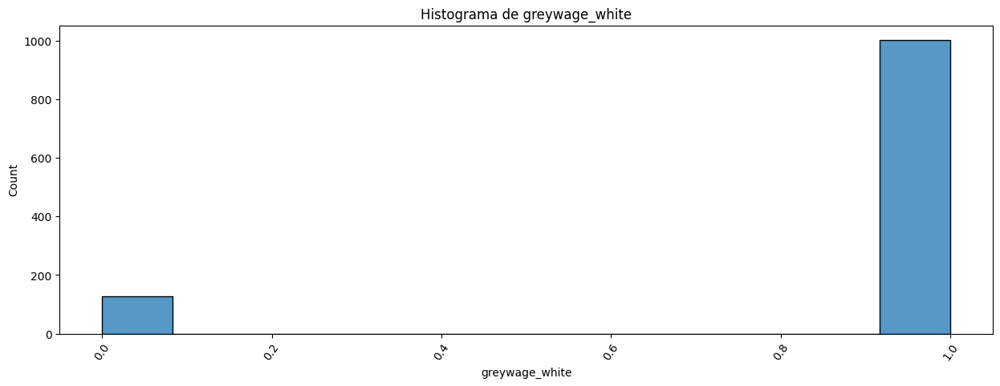

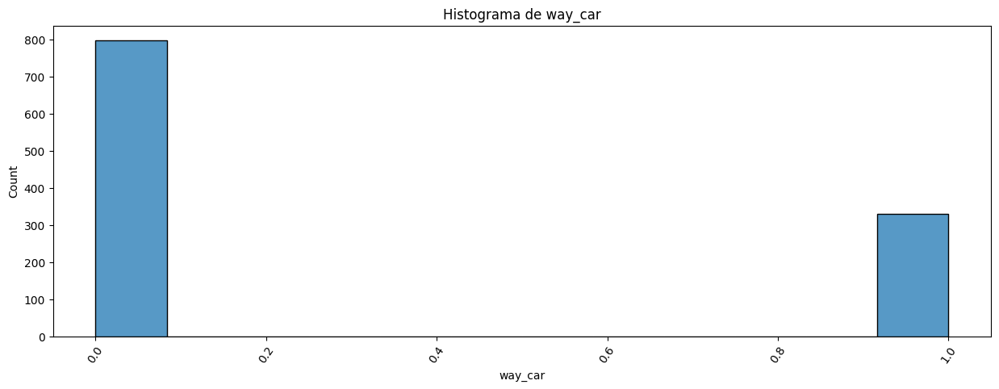

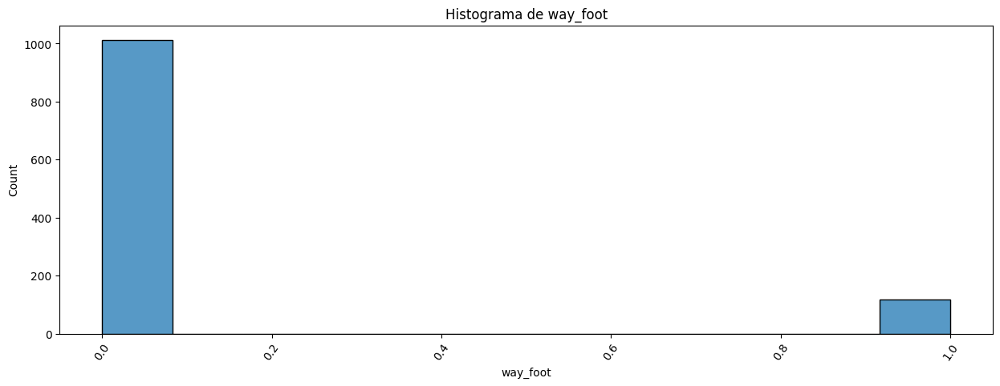

In [29]:
# Revisamos con graficos nuestras nuevas variables

histograma (df_binarizado)

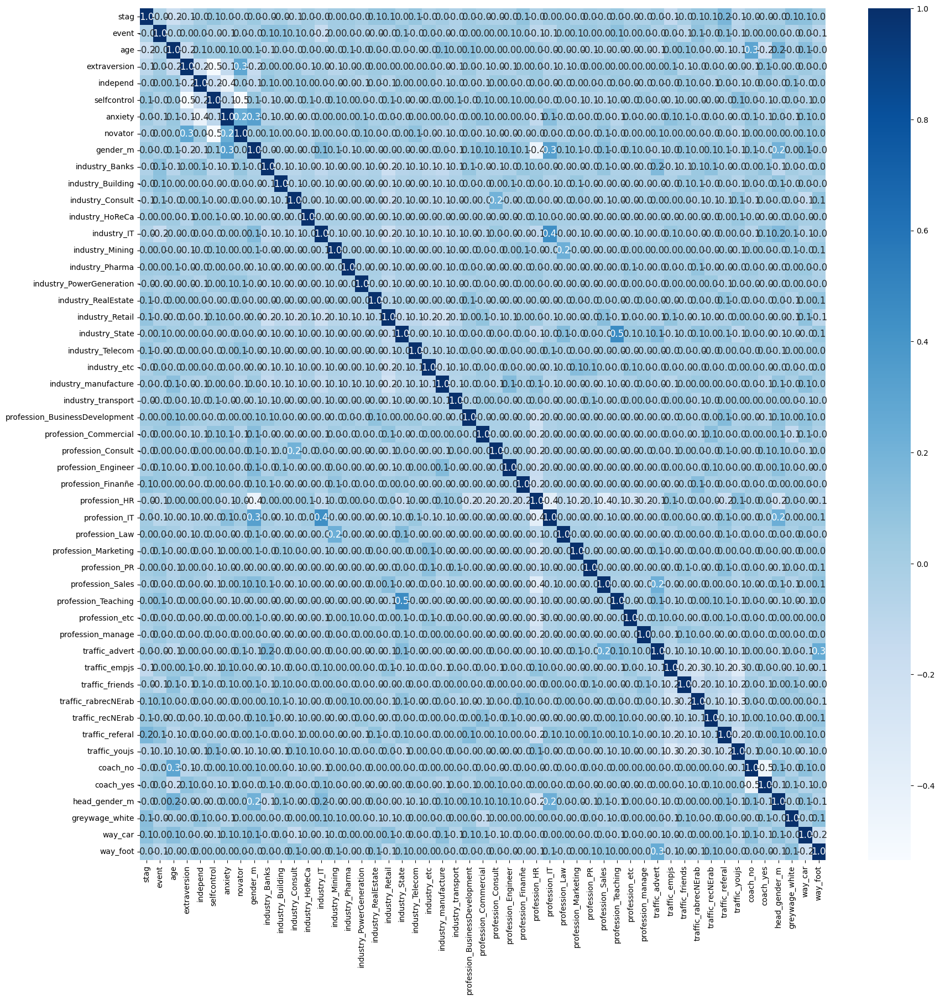

In [30]:
plt.subplots(figsize=(20, 20))
sns.heatmap(df_binarizado.corr(), cmap='Blues', annot=True, annot_kws={"size": 12}, fmt=".1f");
plt.show()

Se observa una correlación de un 50% entre:
  - profession_Teaching con Industry_State
    
Mientras que Profesion IT con  industry_IT un 40%

y un 30%
- Profesion IT con gender_m
- traffic_advert con way_foot
- coach_no con age
- noovator_opprenes con extraversion
- ansiedad con gener_m

________

## <font color='DeepPink'>Sección 4 - Modelación predictiva</font>

### 4.1 La implementación de por lo menos tres modelos predictivos. 

In [31]:
# separemos los vectores a trabajar
df_var_y= df_binarizado['event']
df_var_x = df_binarizado.drop(columns=['event'])

In [32]:
df_var_x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1129 entries, 0 to 1128
Data columns (total 50 columns):
 #   Column                          Non-Null Count  Dtype
---  ------                          --------------  -----
 0   stag                            1129 non-null   int32
 1   age                             1129 non-null   int32
 2   extraversion                    1129 non-null   int32
 3   independ                        1129 non-null   int32
 4   selfcontrol                     1129 non-null   int32
 5   anxiety                         1129 non-null   int32
 6   novator                         1129 non-null   int32
 7   gender_m                        1129 non-null   uint8
 8   industry_Banks                  1129 non-null   uint8
 9   industry_Building               1129 non-null   uint8
 10  industry_Consult                1129 non-null   uint8
 11  industry_HoReCa                 1129 non-null   uint8
 12  industry_IT                     1129 non-null   uint8
 13  ind

In [33]:
#Se define el conjunto de entrenamiento y validacion
x_train, x_test, y_train, y_test = train_test_split(df_var_x, df_var_y, test_size=.33,
random_state=27)

In [34]:
# estandarizamos la matriz de entrenamiento
x_train_std = StandardScaler().fit_transform(x_train)

# estandarizamos la matriz de pruebas
x_test_std = StandardScaler().fit_transform(x_test)

In [35]:
# df_refactorizado.info()

In [36]:
# #Se cuentan los NaN en dataframe
# df_refactorizado.isna().sum()

In [37]:
# iniciamos el modelo con la clase LogisticRegression y pasamos los datos en fit.
default_model = LogisticRegression().fit(x_train_std, y_train)
default_model

LogisticRegression()

In [38]:
default_model.coef_


array([[-1.60728929e-01, -1.87203631e-01, -1.77459087e-02,
         7.42737325e-02,  6.15106063e-02, -2.57706682e-02,
         1.21360465e-01, -1.24268595e-01,  2.63423021e-01,
         1.97634391e-01,  1.56926439e-01, -5.93559846e-02,
        -3.98687316e-01,  1.33682527e-02,  6.83217073e-02,
        -6.40904051e-02, -9.77283988e-02, -4.84780253e-02,
        -1.41295650e-01,  3.77728630e-02,  5.39197200e-02,
        -3.96661281e-04, -7.28626501e-02, -1.39142991e-01,
        -1.19246666e-02, -1.10660662e-01,  2.40744002e-02,
        -6.04440692e-02, -6.32336735e-01, -2.48374344e-01,
         1.10383601e-03, -1.11242769e-01, -2.56691121e-02,
        -2.75194833e-01,  5.19625357e-01, -2.68814583e-01,
        -6.01503266e-02, -9.78994823e-02,  2.17568586e-01,
        -1.30211843e-01,  2.19699921e-01, -9.95592682e-02,
         2.42231647e-01, -5.70693219e-02,  9.82725972e-02,
         8.58010528e-02,  6.65432049e-02, -9.31269767e-02,
         3.66931627e-03, -1.69665729e-01]])

### 4.2.-  implementación de por lo menos tres modelos predictivos.


#### Modelo 1 - Rregresión Logistica

Generaremos la prediccion de clases y probabilidad

In [39]:
#Generaremos la prediccion de clases y probabilidad
yhat = default_model.predict(x_test_std)
# solicitemos las primeras 20 observaciones del vector predicho.
yhat[:20]

array([0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0],
      dtype=int64)

In [40]:
yhat_probabilidad = default_model.predict_proba(x_test_std)
yhat_probabilidad[:10].round(2)

array([[0.89, 0.11],
       [0.75, 0.25],
       [0.41, 0.59],
       [0.56, 0.44],
       [0.41, 0.59],
       [0.65, 0.35],
       [0.41, 0.59],
       [0.37, 0.63],
       [0.58, 0.42],
       [0.34, 0.66]])

In [41]:
#Creamos la matriz de confusión
m1_confusion = confusion_matrix(y_test, yhat)
m1_confusion

array([[113,  68],
       [ 78, 114]], dtype=int64)

In [42]:
# comparemos con pd.crosstab
m1_conf_pd = pd.crosstab(y_test, yhat)
m1_conf_pd

col_0,0,1
event,,
0,113,68
1,78,114


In [43]:
#Extraemos el accuracy
m1_acc = accuracy_score(y_test, yhat)
m1_prec = precision_score(y_test, yhat)
m1_rec = recall_score(y_test, yhat)

print("Accuracy:", m1_acc,  "\nPrecision: ", m1_prec, "\nRecall: ", m1_rec)


Accuracy: 0.6085790884718498 
Precision:  0.6263736263736264 
Recall:  0.59375


In [44]:
#reportamos las métricas de precisión, recall y f1-score para ambas clases
print(classification_report(y_test, yhat))

              precision    recall  f1-score   support

           0       0.59      0.62      0.61       181
           1       0.63      0.59      0.61       192

    accuracy                           0.61       373
   macro avg       0.61      0.61      0.61       373
weighted avg       0.61      0.61      0.61       373



#### **Grafique la curva Receiver Operator Characteristic.**

In [45]:
#Curva ROC
plt.rcParams['figure.figsize'] = (12, 10)

#volvemos a estimar los valores para obtener pa prob entre 0 y 1
yhat_roc = default_model.predict_proba(x_test_std)[:, 1]

#generamos los objetos de roc cruve
false_positive, true_positive, threshold = roc_curve(y_test, yhat_roc)


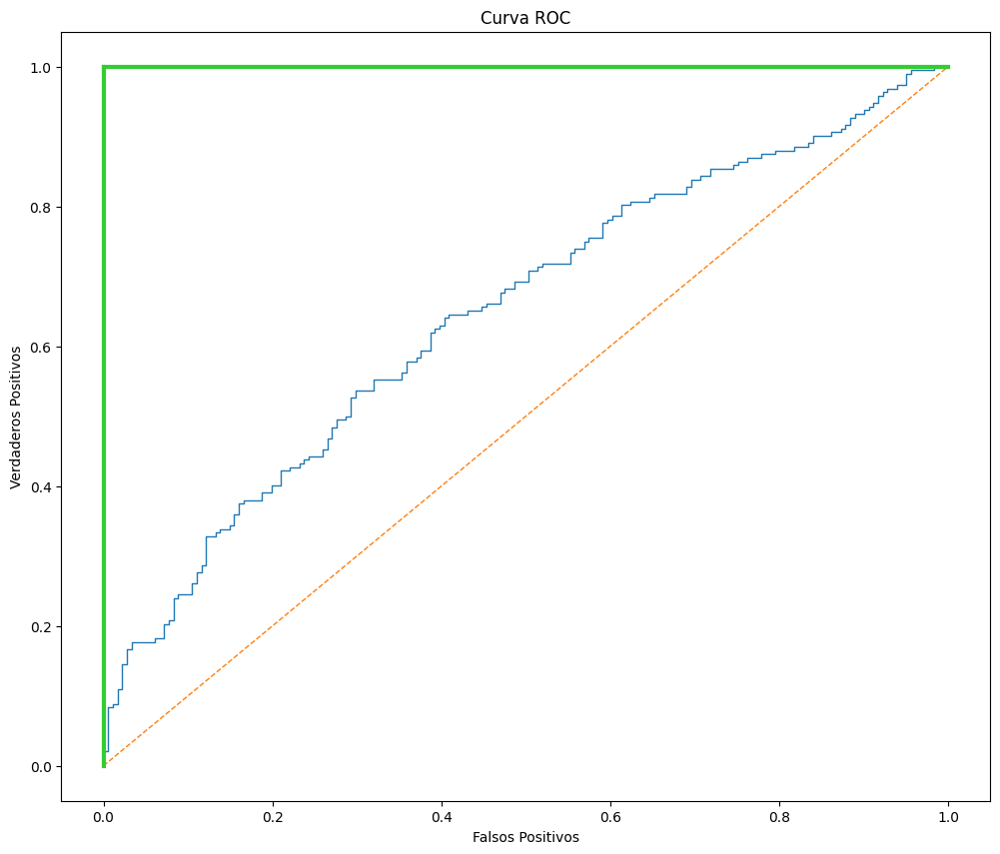

In [46]:
# Plot ROC curve
plt.title('Curva ROC')
plt.plot(false_positive, true_positive, lw=1)
plt.plot([0, 1], ls="--", lw=1)
plt.plot([0, 0], [1, 0] , c='limegreen', lw=3), plt.plot([1, 1] ,
c='limegreen', lw=3)
plt.ylabel('Verdaderos Positivos')
plt.xlabel('Falsos Positivos');
plt.show()

In [47]:
#estimamos el area bajo la curva
roc_auc_score(y_test,yhat_roc)

0.6473008747697975

**El modelo tiene una precisión de:** 
- 59% para la clase 0
- 63% para la clase 1

**El modelo tiene una sensibilidad(recall) de**:
- 62% para la clase 0
- 59% para la clase 1

**El modelo tiene un f1-score(media armonica entre pres. y sensibilidad) de**:
- 61% para la clase 0
- 61% para la clase 1

**Con un valor de .64, nuestro modelo tiene un desempeño de 14% superior a un mecanismo de clasificación aleatoria. Es aceptable, pero se puede mejorar.**

_________

### 4.3.-  Modelo 2 y 3 : "DecisionTreeClassifier" y "KNeighborsClassifier"

In [48]:
#Importams librerias
from sklearn.tree import DecisionTreeClassifier

#definimos en una variable la clase
dtc = DecisionTreeClassifier()

#Iniciamos el modelo con la clase DecisionTreeClassifier y pasamos los datos en fit.
dtc.fit(x_train_std, y_train)

DecisionTreeClassifier()

In [49]:
#Importams librerias
from sklearn.neighbors import KNeighborsClassifier

#definimos en una variable la clase
knn = KNeighborsClassifier(n_neighbors=3)

#Iniciamos el modelo con la clase KNeighborsClassifier y pasamos los datos en fit.
knn.fit(x_train_std, y_train)


KNeighborsClassifier(n_neighbors=3)

In [50]:
#Generaremos la prediccion de clases y probabilidad con Score Desicion Tree
y_hat_tree = dtc.predict(x_test_std)


acc_tree = dtc.score(x_test_std, y_test)
print(acc_tree)

0.6300268096514745


In [51]:
#Generaremos la prediccion de clases y probabilidad con Score Desicion Tree
y_hat_knn = knn.predict(x_test_std)


acc_knn = knn.score(x_test_std, y_test)
print(acc_knn)

0.6273458445040214


In [52]:
#LogisticRegression
print(classification_report(y_test, yhat))

              precision    recall  f1-score   support

           0       0.59      0.62      0.61       181
           1       0.63      0.59      0.61       192

    accuracy                           0.61       373
   macro avg       0.61      0.61      0.61       373
weighted avg       0.61      0.61      0.61       373



In [53]:
#Desicion Tree Report
print(classification_report(y_test, y_hat_tree))

              precision    recall  f1-score   support

           0       0.61      0.66      0.63       181
           1       0.65      0.60      0.62       192

    accuracy                           0.63       373
   macro avg       0.63      0.63      0.63       373
weighted avg       0.63      0.63      0.63       373



In [54]:
#KNN Report
print(classification_report(y_test, y_hat_knn))

              precision    recall  f1-score   support

           0       0.62      0.60      0.61       181
           1       0.63      0.65      0.64       192

    accuracy                           0.63       373
   macro avg       0.63      0.63      0.63       373
weighted avg       0.63      0.63      0.63       373



### 4.4 reporte del mejor modelo predictivo en base a los resultados. 


Observamos que al comparar los tres modelos predictivos se obtienen diferentes resultados, se presentan en la siguiente lista desde el mejor modelo al peor.

1.- KNeighbors Classifier

2.- Decision Tree Classifier

3.- Logistic Regression

En primer lugar se comparó el accuracy con 0.63, 0.62, 0.61 respectivamente.

De la misma manera se comparó precision, recall y f1-score, en donde se obtienen resultados que aseveran el orden de mejor modelo a peor modelo predictivo.

Recordemos que precision corresponde a la puntuación que permite medir el rendimiento del modelo a partir del recuento de verdaderos positivos de la manera correcta de todas las predicciones positivas realizadas. En el caso de nuestro mejor modelo corresponde a un 62%

Recall corresponde a la puntuación que permite medir el rendimiento del modelo a partir del recuento de verdaderos positivos de forma correcta de todos los valores positivos reales. En nuestro mejor modelo predictivo tiene un puntaje de 0.60.

Accuracy corresponde a la puntuación que permite medir el rendimiento del modelo a partir de la proporción de la suma de verdaderos positivos y verdaderos negativos de todas las predicciones realizadas. En nuestro mejor modelo predictivo tiene un puntaje de 0.63, al compararlo con los otros mdelos tiene una variablidad desde 1% superior.

Finalmente recordemos que F1-Score es la media armónica de la precisión y recall;  y se utiliza como métrica en los escenarios en los que la elección de la precisión o recall puede resultar en un compromiso en términos de que el modelo proporcione un alto número de falsos positivos y falsos negativos, respectivamente. Nuestro mejor caso alcanza el 61%

## <font color='DeepPink'>Sección 5 - Preguntas del Challenge</font>

### 1. ¿Qué variables presentan alguna relación con la rotación? ¿Qué tipo de relación presentan? ¿Es significativa?

Según lo estudiado anteriormente las variables que presentan alguna relación con el aumento de rotación de personal de manera significativa son las siguientes:

- Las edad es una variable significativa para los eventos de rotación de personal, siendo así que las personas con edad entre los 22 a 24 años presentan una mayor probabilidad, de mayor manera las personas con 22 años presentan un peack mayor en las renuncias que otras edades.

- La industria que presenta un mayor numero de renuncias es la industria del banco, seguida por el Retail.

- Como el empleado se contacta con la empresa en por primera vez tiende a existir una mayor frecuencia en las personas que el empleador se puso en contacto con el trabajador por recomendación de una persona que le conoce(rabrecNErab), seguido por la diferencia entre las personas que se contactaron directamente con la empresa por recomendación de un amigo, que es empleado de la misma (referal).

- Las personas extrovertidas tienen levemente a presentar un mayor numero de renuncia vs los trabajadores que tienen un puntaje promedio.

- Las personas que tienen un puntaje medio (entre 4.9 a 5.7 aproximadamente) tienden a presentar un mayor numero de renuncia.

- Las personas con ansiedad moderada a baja tienden a presentar levemente más renuncia versus los otros puntajes.

- Las personas con puntaje medio en la variable abierto de mente tienen levemente a presentar mayor renuncia vs los otros puntajes

### 2. ¿Podemos crear un modelo que permita identificar a un empleado con alto riesgo de rotación? ¿Cuáles son los pros y los contras de un modelo de este tipo?

Sí, se puede crear un modelo que permita identificar a un empleado con alto riesgo de rotación, es decir, con modelos de regresión podemos identificar los empleados de mayor riesgo.

Los PROS de los modelos de regresión es que tienen un bajo costo computacional y toman menor tiempo al aplicarlo. 

Los CONTRAS en la regresion existen varios modelos y se deben definir bien las metricas que se van a medir los modelos para compararlos y elegir el que tenga mejor los resultados. Esto se demuestra en las metricas mostradas anteriormente en la comparación de tres modelos de predicción.

### 3. ¿Cómo podemos medir el desempeño de un modelo de estas características?

Podemos evaluar el modelo con f1-score (media armonica entre precisión y sensibilidad) para la evaluación interna del modelo, y a la hora de mostrar los resultados a la empresa mostrar los resultados del accurracy, ya que este tiende a tener resultados más esperanzadores para el cliente.

### 4. ¿Qué otros tipos de datos pueden ser valiosos para alimentar a estos modelos?

Otros datos que pueden ser valioso para enriquecer la data son las siguientes:
- Ambiente laboral: Si el trabajador se siente que esta en un buen ambiente laboral o no.
- Crecimiento dentro de la empresa: Si el trabajador siente que puede tener crecimiento laboral dentro de la empresa.
- Infravalorado: Si el trabajador se siente infravalorado o no en su trabajo.
- Trabajo satisfactorio para el empleado: Si el trabajador siente que su trabajo es satisfactorio para si mismo.


### 5. ¿Podríamos generar un modelo que identifique a las personas con alto riesgo de rotación antes de contratarlas? ¿En qué se diferenciaría este modelo del anterior?

Según la bibliografia revisada los modelos de machine learning utilizados en la actualidad la gran mayoria son utilizados con el fin de predecir cuando un trabajador contratado desea presentar la renuncia, con el fin de evitarlas a tiempo, ya que es de conocimiento que es más costoso buscar un nuevo empleado, que mantener contento al ya contratado, logrando así retener al talento de la compañía.

La mayoria de los estudios revisados emplean los metodos utilizados en este notebook, acompañandolos con dos modelos más para generar una comparación más completa.

Dentro de mis conocimientos actuales y la data investigada no me hes posible crear un modelo que identifique a las personas con alto riesgo de rotación antes de contratarlas, sin embargo, estaría feliz de poder realizar un modelo predictivo en la empresa con una data que tenga datos más significativos para preever la rotación antes de ser un trabajador contratado.

### 6. ¿Qué recomendarías a Stark Industries para atacar este problema?

Recomiendaría a Stark Industries tener cuidado a la hora de contratar personas entre 22 a 24 años, teniendo en consideración que es donde se presenta la mayor taza de renuncias. De igual manera presentar atención a los profesores que quieren cotratar, ya que su taza de renuncia es muy alta, seguida por trabajadores de banco y consultores.

Asimismo recomiendo a Stark Industries tener en consideración la cercania del personal que quieren contratar, como se muestran en los datos entregados, las personas que caminan al trabajo tienden a tener una menor probabilidad de renunciar.

Adicionalmente le recomendaría a Stark Industries realizar encuestas con preguntas significativas a los empleados con el fin de encontrar a tiempo la razón de porque sus empleados están presentando las renuncias, lograndó así llegar a tiempo para retener el talento de la compañia y evitar su renuncia.

También sugerir mantener a sus empleados en un buen ambiente laboral, ya que es demostrado a base de investigaciones que un mal ambiente laboral es uno de los principales factores influyentes en los motivos de renuncia.

Por lo dicho anteriormente es importante siempre mantener las buenas practicas laborales y un buen ambiente  laboral.

## <font color='DeepPink'>Sección 6 - Conclusiones</font>

Tras el análisis de los datos, podemos deducir que las personas que cuentan con las siguientes caracteristicas tienden a  presentar un mayor indice de presentar las renuncias en sus trabajos:

- Ser profesor o personal de banco
- Tener una edad entre 22 a 24 años
- Poseer nada o muy poca experiencia laboral
- Vivir lejos del trabajo y transportarse en bus
- Tender a presentar un alto puntaje a la eencuesta de simpatia o independencia
- Presentar ansiedad moderada a baja en la encuesta realizada.


Sin embargo, por estudios realizados por diversas investigaciones de Recursos Humanos, hay más variables que se pueden agregar a la data en forma de encuesta a los trabajadores, tales como: ambiente laboral, crecimiento dentro de la empresa, si se siente valorizado en su trabajo actual y si es un trabajo satisfactorio para el colaborador de la empresa. Estas variables mencionadas son unas de las principales causas de renuncia en nuestro mundo actual. Es por ello que se sugiere realizar una nueva encuesta con los topicos mencionados para recabar más información con los empleados que están actualmente colaborando con Stark Industries, con el fin de encontrar a tiempo las  posibles renuncias, llegando a tiempo para evitar las rotaciones de trabajo y sobretodo retener al talento de la compañía.